<a href="https://colab.research.google.com/github/Jae2Wook/Machine-Learning-Class/blob/main/Copy_of_starter_bank.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

STAKEHOLDER FOCUS AREAS

The shareholders are particularly interested in the following areas:

1. Finding interesting customer segments based on their previous marketing campaign.
2. Finding a way to identify the types of customers most likely to respond favorably to future marketing campaigns.
3. Proving to a skeptical Senhor Ferreira that a targeted campaign based on data science will significantly outperform a campaign made up of randomly selected customers.

https://www.datacamp.com/community/tutorials/decision-tree-classification-python

In [ ]:
import pandas as pd # to load and manipulate data and for One-Hot Encoding
import matplotlib.pyplot as plt # to draw graphs
from sklearn.tree import DecisionTreeClassifier # to build a classification tree
from sklearn.tree import plot_tree # to draw a classification tree
from sklearn.model_selection import train_test_split #to split data into training and testing sets
from sklearn.model_selection import cross_val_score # for cross validation
from sklearn.metrics import confusion_matrix # to creat a condusion matrix
from sklearn.metrics import plot_confusion_matrix # to draw a confusion matrix
import numpy as np

campaign = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bank.csv')
campaign.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
campaign.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  campaign        41188 non-null  int64  
 11  pdays           41188 non-null  int64  
 12  previous        41188 non-null  int64  
 13  poutcome        41188 non-null  object 
 14  emp.var.rate    41188 non-null  float64
 15  cons.price.idx  41188 non-null  float64
 16  cons.conf.idx   41188 non-null  float64
 17  euribor3m       41188 non-null 

In [ ]:
campaign.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

Identifying missing data --> use .unique() and if there is '?', then there is a missing value.

In [ ]:
campaign = campaign.drop(["default"], axis = 1)

In [ ]:
campaign_no_unkown = campaign.replace({"unknown": np.nan}).dropna()

Decision Tree

In [ ]:
X = campaign_no_unkown.drop(["y"], axis = 1).copy()
y = campaign_no_unkown["y"].copy()

In [ ]:
X_encoded = pd.get_dummies(X, columns = ["job", "marital", "education", "housing", "loan", "contact", "month", "day_of_week", "poutcome"])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, random_state = 42)
clf = DecisionTreeClassifier(random_state = 42)
clf = clf.fit(X_train, y_train)

[Text(365.59316168240224, 535.8342857142858, 'nr.employed <= 5087.65\ngini = 0.197\nsamples = 28683\nvalue = [25500, 3183]'),
 Text(127.59174388720945, 520.3028571428572, 'pdays <= 16.5\ngini = 0.495\nsamples = 3324\nvalue = [1826, 1498]'),
 Text(36.186473111498614, 504.7714285714286, 'emp.var.rate <= -2.35\ngini = 0.425\nsamples = 841\nvalue = [258, 583]'),
 Text(20.8005392090472, 489.24, 'euribor3m <= 0.865\ngini = 0.476\nsamples = 363\nvalue = [142, 221]'),
 Text(16.397177828942915, 473.7085714285714, 'campaign <= 3.5\ngini = 0.45\nsamples = 240\nvalue = [82, 158]'),
 Text(12.842842148032776, 458.1771428571429, 'education_professional.course <= 0.5\ngini = 0.435\nsamples = 225\nvalue = [72, 153]'),
 Text(7.547944741653687, 442.6457142857143, 'euribor3m <= 0.715\ngini = 0.451\nsamples = 201\nvalue = [69, 132]'),
 Text(3.9676305275275956, 427.11428571428576, 'euribor3m <= 0.703\ngini = 0.353\nsamples = 70\nvalue = [16, 54]'),
 Text(3.6653348682873976, 411.58285714285716, 'gini = 0.0\n

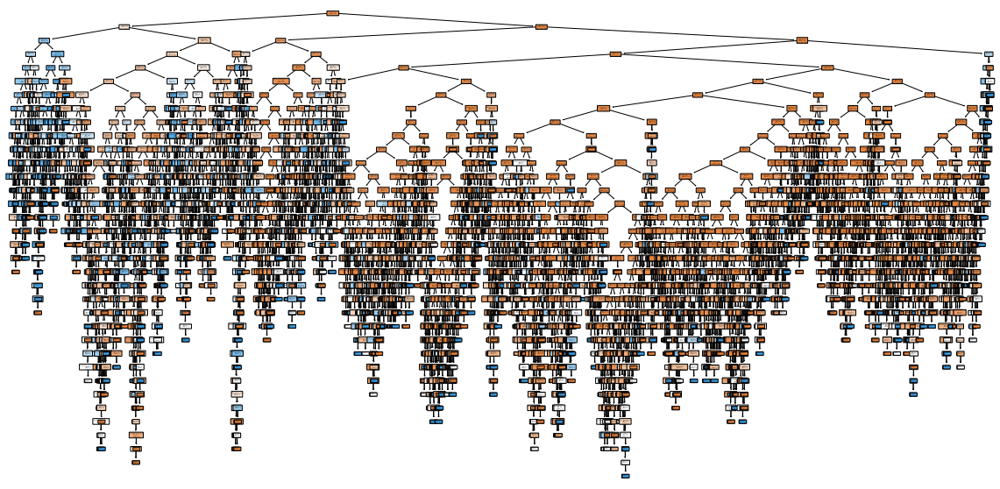

In [ ]:
plt.figure(figsize = (20, 10))
plot_tree(clf, filled = True, rounded = True, feature_names = X_encoded.columns)

In [ ]:
clf.score(X_test, y_test)

0.8462664714494875

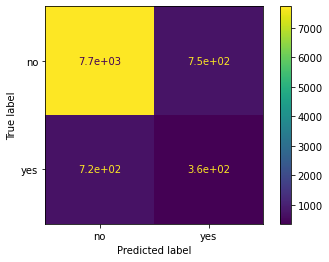

In [ ]:
plot_confusion_matrix(clf, X_test, y_test)

In [ ]:
clf.score(X_test, y_test)

0.8462664714494875

Cost Complexity Pruning

In [ ]:
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas = ccp_alphas[:-1]
clf_cc = []
for ccp_alpha in ccp_alphas:
  clf = DecisionTreeClassifier(random_state = 0, ccp_alpha = ccp_alpha)
  clf.fit(X_train, y_train)
  clf_cc.append(clf)

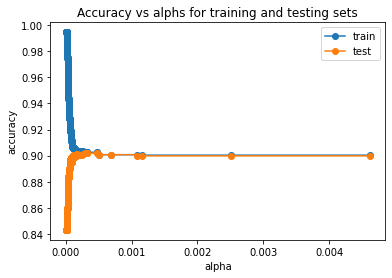

In [ ]:
train_scores = [clf.score(X_train, y_train) for clf in clf_cc]
test_scores = [clf.score(X_test, y_test) for clf in clf_cc]
fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alphs for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker = "o", label = "train", drawstyle = "steps-post")
ax.plot(ccp_alphas, test_scores, marker = "o", label = "test", drawstyle = "steps-post")
ax.legend()
plt.show()

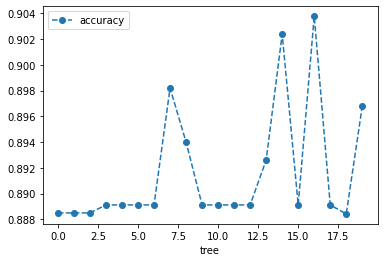

In [ ]:
scores = cross_val_score(clf, X_train, y_train, cv = 20)
df = pd.DataFrame(data = {"tree": range(20), "accuracy":scores})
df.plot(x = "tree", y = "accuracy", marker = "o", linestyle = "--")

In [ ]:
ideal_ccp_alpha = 0.0013

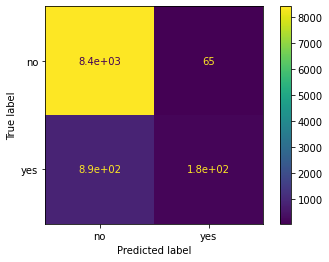

In [ ]:
clf_prunned = DecisionTreeClassifier(random_state = 42, ccp_alpha = ideal_ccp_alpha)
clf_prunned = clf_prunned.fit(X_train, y_train)

plot_confusion_matrix(clf_prunned, X_test, y_test)

In [ ]:
clf_prunned.score(X_test, y_test)

0.8998117548629994

[Text(418.5, 339.75, 'nr.employed <= 5087.65\ngini = 0.197\nsamples = 28683\nvalue = [25500, 3183]\nclass = No'),
 Text(209.25, 203.84999999999997, 'pdays <= 16.5\ngini = 0.495\nsamples = 3324\nvalue = [1826, 1498]\nclass = No'),
 Text(104.625, 67.94999999999999, 'gini = 0.425\nsamples = 841\nvalue = [258, 583]\nclass = Yes'),
 Text(313.875, 67.94999999999999, 'gini = 0.465\nsamples = 2483\nvalue = [1568, 915]\nclass = No'),
 Text(627.75, 203.84999999999997, 'cons.conf.idx <= -46.65\ngini = 0.124\nsamples = 25359\nvalue = [23674, 1685]\nclass = No'),
 Text(523.125, 67.94999999999999, 'gini = 0.317\nsamples = 1928\nvalue = [1547, 381]\nclass = No'),
 Text(732.375, 67.94999999999999, 'gini = 0.105\nsamples = 23431\nvalue = [22127, 1304]\nclass = No')]

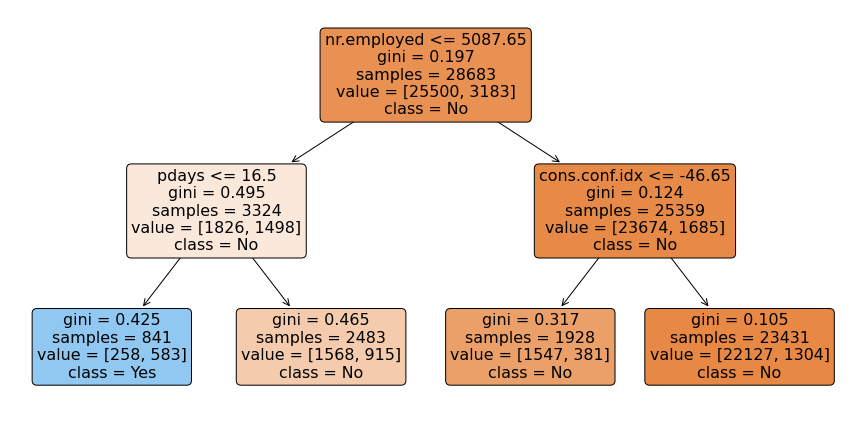

In [ ]:
plt.figure(figsize = (15, 7.5))
plot_tree(clf_prunned, filled = True, rounded = True, feature_names = X_encoded.columns, class_names = ["No", "Yes"])

In [ ]:
campaign["nr.employed"].value_counts()

5228.1    16234
5099.1     8534
5191.0     7763
5195.8     3683
5076.2     1663
5017.5     1071
4991.6      773
5008.7      650
4963.6      635
5023.5      172
5176.3       10
Name: nr.employed, dtype: int64

Depth = 5

In [ ]:
clf_s = DecisionTreeClassifier(max_depth = 3, random_state = 1)
clf_s.fit(X_train, y_train)

y_pred = clf_s.predict(X_test)
clf_s.score(X_test, y_test)

0.9007529805480025

[Text(1395.0, 1426.95, 'nr.employed <= 5087.65\ngini = 0.197\nsamples = 28683\nvalue = [25500, 3183]\nclass = No'),
 Text(697.5, 1019.25, 'pdays <= 16.5\ngini = 0.495\nsamples = 3324\nvalue = [1826, 1498]\nclass = No'),
 Text(348.75, 611.55, 'emp.var.rate <= -2.35\ngini = 0.425\nsamples = 841\nvalue = [258, 583]\nclass = Yes'),
 Text(174.375, 203.8499999999999, 'gini = 0.476\nsamples = 363\nvalue = [142, 221]\nclass = Yes'),
 Text(523.125, 203.8499999999999, 'gini = 0.368\nsamples = 478\nvalue = [116, 362]\nclass = Yes'),
 Text(1046.25, 611.55, 'contact_telephone <= 0.5\ngini = 0.465\nsamples = 2483\nvalue = [1568, 915]\nclass = No'),
 Text(871.875, 203.8499999999999, 'gini = 0.478\nsamples = 2092\nvalue = [1264, 828]\nclass = No'),
 Text(1220.625, 203.8499999999999, 'gini = 0.346\nsamples = 391\nvalue = [304, 87]\nclass = No'),
 Text(2092.5, 1019.25, 'cons.conf.idx <= -46.65\ngini = 0.124\nsamples = 25359\nvalue = [23674, 1685]\nclass = No'),
 Text(1743.75, 611.55, 'euribor3m <= 1.368

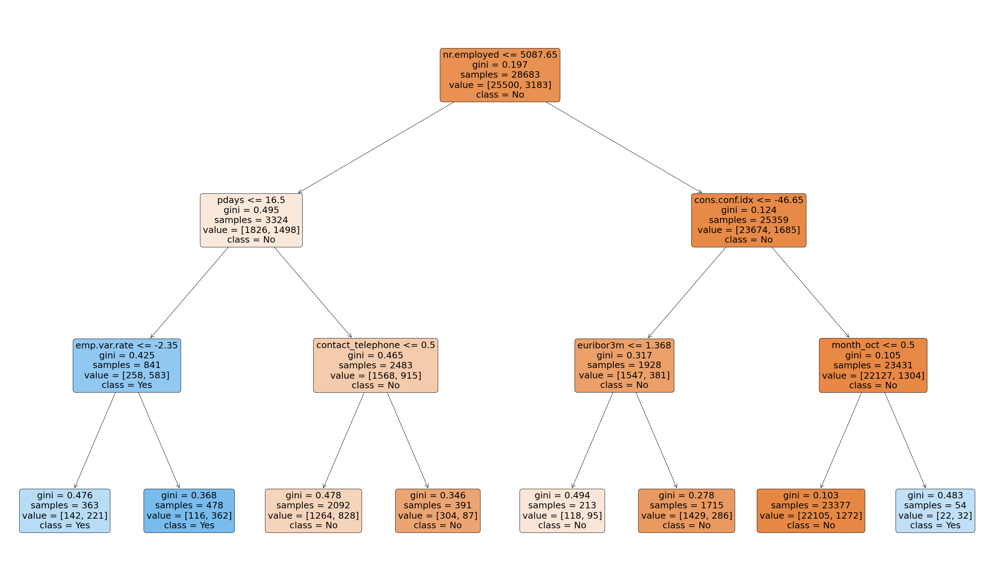

In [ ]:
plt.figure(figsize = (50, 30))
plot_tree(clf_s, filled = True, rounded = True, feature_names = X_encoded.columns, class_names = ["No", "Yes"])

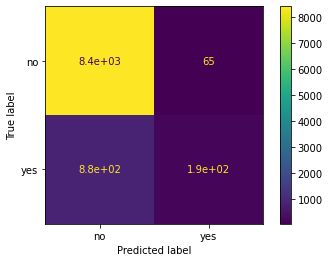

In [ ]:
plot_confusion_matrix(clf_s, X_test,y_test)

Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(n_estimators = 150)
rf_clf.fit(X_train, y_train)
rf_clf.score(X_test, y_test)

0.890190336749634

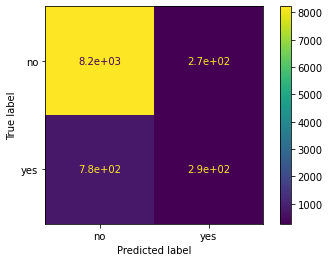

In [ ]:
plot_confusion_matrix(rf_clf, X_test, y_test)

Action patterns

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


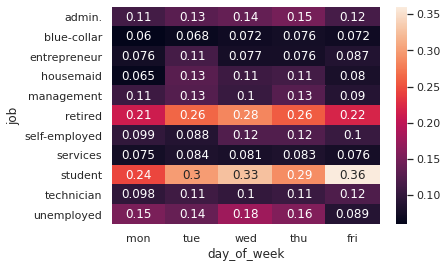

In [ ]:
import seaborn as sns; sns.set_theme()

campaign_no_unkown1 = campaign.replace({"unknown": np.nan}).dropna()

job_dayofweek = campaign_no_unkown1[["day_of_week", "job", "y"]]

job_dayofweek["y"] = job_dayofweek.y.replace({"yes":1})
job_dayofweek["y"] = job_dayofweek.y.replace({"no":0})

job_dayofweek

job_dayofweek2 = job_dayofweek.pivot_table("y", index = "job", columns = "day_of_week")

column_order = job_dayofweek.day_of_week.unique()
job_dayofweek3 = job_dayofweek2.reindex(column_order, axis = 1)

ax = sns.heatmap(job_dayofweek3, annot = True)
ax

In [ ]:
job_dayofweek2

day_of_week,fri,mon,thu,tue,wed
job,,,,,
admin.,0.115167,0.113492,0.149902,0.129315,0.137436
blue-collar,0.071867,0.059754,0.075731,0.067890,0.072009
entrepreneur,0.087302,0.075908,0.076412,0.114286,0.077220
housemaid,0.079755,0.064516,0.113514,0.128440,0.107843
management,0.089796,0.108153,0.127306,0.125455,0.104587
retired,0.219269,0.211656,0.257732,0.263006,0.284345
self-employed,0.104478,0.098639,0.124224,0.088235,0.123348
services,0.076369,0.075377,0.083333,0.083906,0.080622
student,0.360000,0.244604,0.288462,0.300000,0.326087


In [ ]:
jobs = campaign_no_unkown[["job", "day_of_week", "y"]]

jobs_yes_prob = jobs[jobs.y == "yes"].job.value_counts() / jobs.job.value_counts() * 100
jobs_yes_prob.sort_values(ascending = False)

student          30.232558
retired          24.730501
unemployed       14.330218
admin.           12.911341
management       11.143695
self-employed    10.822832
technician       10.705329
housemaid         9.929078
entrepreneur      8.529412
services          7.992465
blue-collar       6.950935
Name: job, dtype: float64

Contact to often

In [ ]:
contact = campaign_no_unkown[["campaign", "y"]]

con_suc_prob = contact[contact.y == "yes"].y.count() / contact.y.count() * 100
con_suc_prob

11.133481500849784

In [ ]:
oft_con = contact[contact.campaign > 1]
oft_con_prob = oft_con[oft_con.y == "yes"].y.count() / oft_con.y.count()
oft_con_prob

0.09908550525834477

In [ ]:
oft_con.count()

campaign    21870
y           21870
dtype: int64

In [ ]:
oft_con = contact[contact.campaign <= 1]
oft_con_prob = oft_con[oft_con.y == "yes"].y.count() / oft_con.y.count()
oft_con_prob

0.1276946564885496

In [ ]:
oft_con.count()

campaign    16375
y           16375
dtype: int64

labeling categories

In [ ]:
from sklearn import preprocessing

le = preprocessing.LabelEncoder()
# All non-numeric columns
columns_to_encode = client.select_dtypes(exclude=np.number).columns
# Encoding all the non-numeric columns
for column in columns_to_encode:
  client[column] = le.fit_transform(client[column])

NameError: ignored

Consumer Confidence Index

In [ ]:
import numpy as np

campaign_no_unkown = campaign.replace({"unknown": np.nan}).dropna()

In [ ]:
good_index = campaign_no_unkown[campaign["cons.conf.idx"] >= - 40]
bad_index = campaign_no_unkown[campaign["cons.conf.idx"] < -40]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


Good

In [ ]:
good_X = good_index.drop(["y"], axis = 1).copy()
good_y = good_index["y"].copy()

In [ ]:
# Oversample the "yes" responses
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler()

good_X_resampled, good_y_resampled = ros.fit_resample(good_X, good_y)
good_X_resampled = pd.DataFrame(good_X_resampled)
good_y_resampled = pd.DataFrame(good_y_resampled)
good_X_resampled.columns = good_X.columns

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
good_X_encoded = pd.get_dummies(good_X_resampled, columns = ["job", "marital", "education", "housing", "loan", "contact", "month", "day_of_week", "poutcome"])

In [ ]:
good_X_train, good_X_test, good_y_train, good_y_test = train_test_split(good_X_encoded, good_y_resampled,random_state = 42)

good_clf = DecisionTreeClassifier(random_state = 42)
good_clf = good_clf.fit(good_X_train, good_y_train)
good_clf.score(good_X_test, good_y_test)

0.9445027748612569

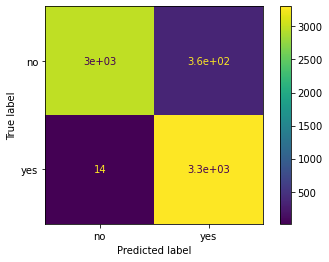

In [ ]:
plot_confusion_matrix(good_clf, good_X_test, good_y_test)

[Text(843.6860608123877, 1072.8947368421052, 'nr.employed <= 5133.6\ngini = 0.5\nsamples = 19999\nvalue = [9984, 10015]\nclass = Yes'),
 Text(353.5723454829633, 1044.2842105263157, 'pdays <= 16.5\ngini = 0.257\nsamples = 8846\nvalue = [1337, 7509]\nclass = Yes'),
 Text(126.88438690705475, 1015.6736842105264, 'nr.employed <= 5049.85\ngini = 0.108\nsamples = 3138\nvalue = [179, 2959]\nclass = Yes'),
 Text(92.57218120988557, 987.0631578947368, 'day_of_week_mon <= 0.5\ngini = 0.092\nsamples = 2705\nvalue = [131, 2574]\nclass = Yes'),
 Text(47.80197410227095, 958.4526315789474, 'poutcome_success <= 0.5\ngini = 0.076\nsamples = 2308\nvalue = [91, 2217]\nclass = Yes'),
 Text(13.43852555546832, 929.8421052631579, 'euribor3m <= 0.649\ngini = 0.164\nsamples = 166\nvalue = [15, 151]\nclass = Yes'),
 Text(12.387100573133392, 901.2315789473685, 'gini = 0.0\nsamples = 3\nvalue = [3, 0]\nclass = No'),
 Text(14.489950537803251, 901.2315789473685, 'job_management <= 0.5\ngini = 0.136\nsamples = 163\nva

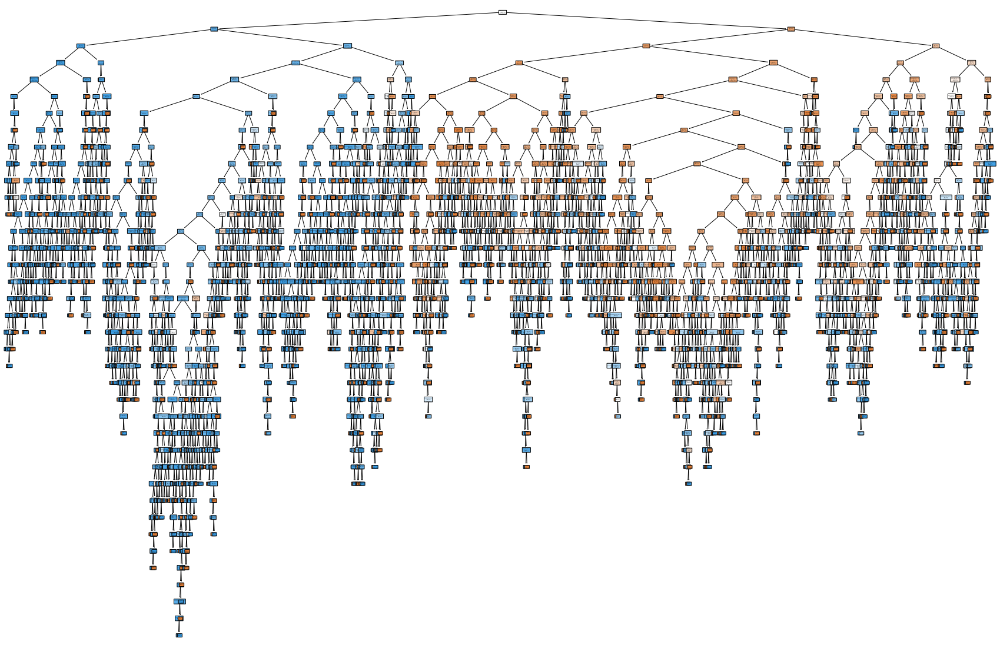

In [ ]:
plt.figure(figsize = (30,20))
plot_tree(good_clf, filled  = True, rounded = True, feature_names = good_X_encoded.columns, class_names = ["No", "Yes"])

depth = 5

In [ ]:
good_clf5 = DecisionTreeClassifier(random_state = 42, max_depth = 4)
good_clf5 = good_clf5.fit(good_X_train, good_y_train)
good_clf5.score(good_X_test, good_y_test) 

0.8128093595320234

Cost Complexity Pruning

In [ ]:
good_path = good_clf.cost_complexity_pruning_path(good_X_train, good_y_train)
good_ccp_alphas = good_path.ccp_alphas
good_ccp_alphas = good_ccp_alphas[:-1]
good_clf_cc = []
for ccp_alpha in good_ccp_alphas:
  clf = DecisionTreeClassifier(random_state = 0, ccp_alpha = ccp_alpha)
  clf.fit(good_X_train, good_y_train)
  good_clf_cc.append(clf)

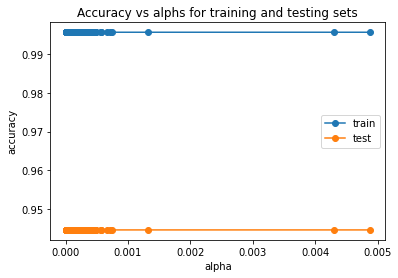

In [ ]:
good_train_scores = [good_clf.score(good_X_train, good_y_train) for clf in good_clf_cc]
good_test_scores = [good_clf.score(good_X_test, good_y_test) for clf in good_clf_cc]
good_fig, good_ax = plt.subplots()
good_ax.set_xlabel("alpha")
good_ax.set_ylabel("accuracy")
good_ax.set_title("Accuracy vs alphs for training and testing sets")
good_ax.plot(good_ccp_alphas, good_train_scores, marker = "o", label = "train", drawstyle = "steps-post")
good_ax.plot(good_ccp_alphas, good_test_scores, marker = "o", label = "test", drawstyle = "steps-post")
good_ax.legend()
plt.show()

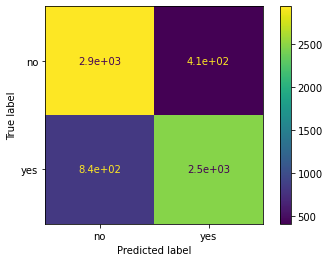

In [ ]:
good_ideal_ccp_alpha = 0.00089

good_clf_prunned = DecisionTreeClassifier(random_state = 42, ccp_alpha = good_ideal_ccp_alpha)
good_clf_prunned = good_clf_prunned.fit(good_X_train, good_y_train)

plot_confusion_matrix(good_clf_prunned, good_X_test, good_y_test)

In [ ]:
good_clf_prunned.score(good_X_test, good_y_test)

0.8126593670316484

Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

good_rf_clf = RandomForestClassifier(random_state = 42, n_estimators = 150)
good_rf_clf = good_rf_clf.fit(good_X_train, good_y_train)
good_rf_clf.score(good_X_test, good_y_test)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


0.9563521823908805

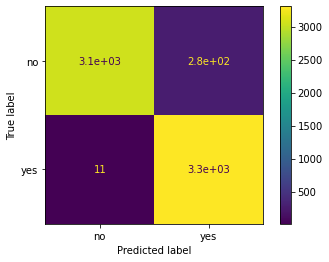

In [ ]:
plot_confusion_matrix(good_rf_clf, good_X_test, good_y_test)

Bad

In [ ]:
bad_X = bad_index.drop(["y"], axis = 1).copy()
bad_y = bad_index["y"].copy()

In [ ]:
# Oversample the "yes" responses
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler()

bad_X_resampled, bad_y_resampled = ros.fit_resample(bad_X, bad_y)
bad_X_resampled = pd.DataFrame(bad_X_resampled)
bad_y_resampled = pd.DataFrame(bad_y_resampled)
bad_X_resampled.columns = bad_X.columns

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
bad_X_encoded = pd.get_dummies(bad_X_resampled, columns = ["job", "marital", "education", "housing", "loan", "contact", "month", "day_of_week", "poutcome"])

In [ ]:
bad_X_train, bad_X_test, bad_y_train, bad_y_test = train_test_split(bad_X_encoded, bad_y_resampled, random_state = 42)

bad_clf = DecisionTreeClassifier(random_state = 42)
bad_clf = bad_clf.fit(bad_X_train, bad_y_train)
bad_clf.score(bad_X_test, bad_y_test)

0.9392853684516317

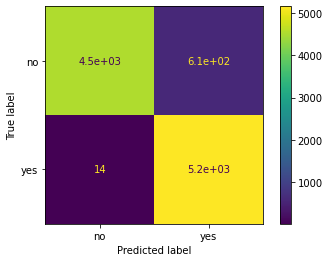

In [ ]:
plot_confusion_matrix(bad_clf, bad_X_test, bad_y_test)

[Text(972.8189149922359, 1072.5081081081082, 'euribor3m <= 3.168\ngini = 0.5\nsamples = 30981\nvalue = [15501, 15480]\nclass = No'),
 Text(429.2878708254608, 1043.1243243243243, 'month_may <= 0.5\ngini = 0.46\nsamples = 16294\nvalue = [5845, 10449]\nclass = Yes'),
 Text(239.65617029493936, 1013.7405405405406, 'euribor3m <= 1.402\ngini = 0.348\nsamples = 9137\nvalue = [2053, 7084]\nclass = Yes'),
 Text(106.62757178515476, 984.3567567567568, 'pdays <= 15.5\ngini = 0.223\nsamples = 5224\nvalue = [668, 4556]\nclass = Yes'),
 Text(24.230357868551653, 954.972972972973, 'previous <= 6.5\ngini = 0.087\nsamples = 1442\nvalue = [66, 1376]\nclass = Yes'),
 Text(23.57067780747017, 925.5891891891893, 'euribor3m <= 1.039\ngini = 0.086\nsamples = 1441\nvalue = [65, 1376]\nclass = Yes'),
 Text(11.86393359851237, 896.2054054054055, 'job_self-employed <= 0.5\ngini = 0.06\nsamples = 905\nvalue = [28, 877]\nclass = Yes'),
 Text(11.204253537430883, 866.8216216216217, 'poutcome_success <= 0.5\ngini = 0.058\

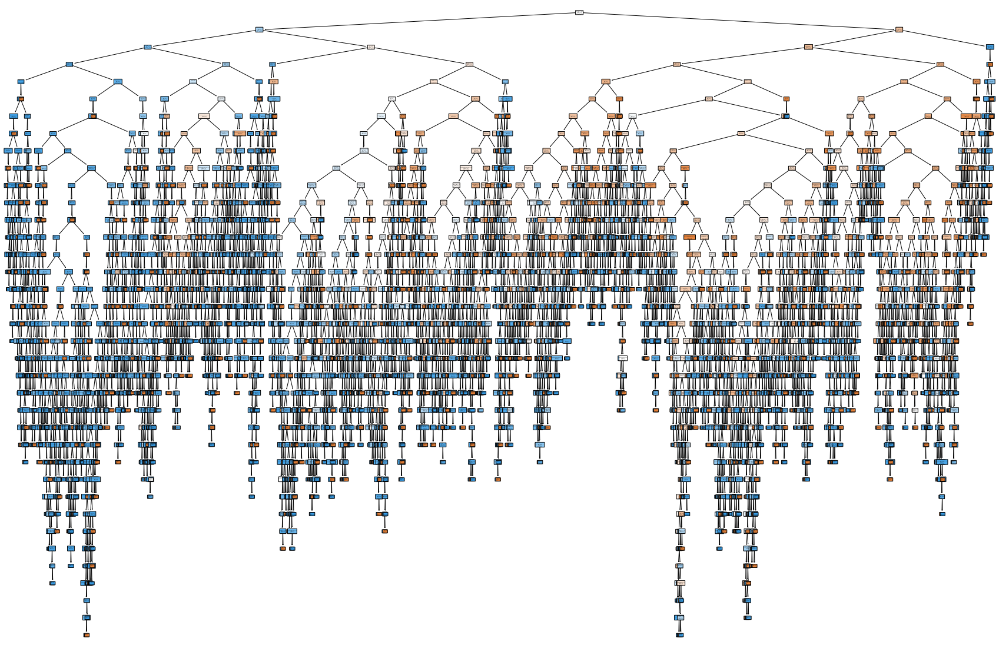

In [ ]:
plt.figure(figsize = (30,20))
plot_tree(bad_clf, filled = True, rounded = True, feature_names = bad_X_encoded.columns, class_names = ["No", "Yes"])

depth = 5

In [ ]:
bad_clf5 = DecisionTreeClassifier(random_state = 42, max_depth = 5)
bad_clf5 = bad_clf5.fit(bad_X_train, bad_y_train)
bad_clf5.score(bad_X_test, bad_y_test)

0.6897453277815435

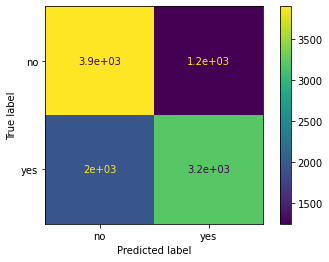

In [ ]:
plot_confusion_matrix(bad_clf5, bad_X_test, bad_y_test)

Cost Complexity Pruning

In [ ]:
bad_path = bad_clf.cost_complexity_pruning_path(bad_X_train, bad_y_train)
bad_ccp_alphas = bad_path.ccp_alphas
bad_ccp_alphas = bad_ccp_alphas[:-1]
bad_clf_cc = []
for ccp_alpha in bad_ccp_alphas:
  clf = DecisionTreeClassifier(random_state = 0, ccp_alpha = ccp_alpha)
  clf.fit(bad_X_train, bad_y_train)
  bad_clf_cc.append(clf)

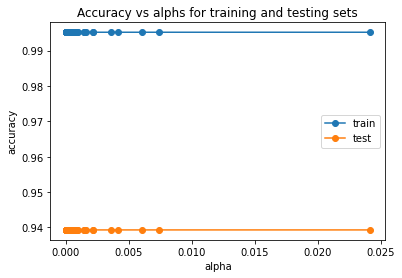

In [ ]:
bad_train_scores = [bad_clf.score(bad_X_train, bad_y_train) for clf in bad_clf_cc]
bad_test_scores = [bad_clf.score(bad_X_test, bad_y_test) for clf in bad_clf_cc]
bad_fig, bad_ax = plt.subplots()
bad_ax.set_xlabel("alpha")
bad_ax.set_ylabel("accuracy")
bad_ax.set_title("Accuracy vs alphs for training and testing sets")
bad_ax.plot(bad_ccp_alphas, bad_train_scores, marker = "o", label = "train", drawstyle = "steps-post")
bad_ax.plot(bad_ccp_alphas, bad_test_scores, marker = "o", label = "test", drawstyle = "steps-post")
bad_ax.legend()
plt.show()

In [ ]:
bad_ideal_ccp_alpha = 0.0055

bad_clf_prunned = DecisionTreeClassifier(random_state = 42, ccp_alpha = bad_ideal_ccp_alpha)
bad_clf_prunned = bad_clf_prunned.fit(bad_X_train, bad_y_train)
bad_clf_prunned.score(bad_X_test, bad_y_test)

0.6741551273361093

Random Forest

In [ ]:
#from sklearn.ensemble import RandomForestClassifier

bad_rf_clf = RandomForestClassifier(random_state = 42, n_estimators = 150)
bad_rf_clf = bad_rf_clf.fit(bad_X_train, bad_y_train)
bad_rf_clf.score(bad_X_test, bad_y_test)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


0.9664955940737872

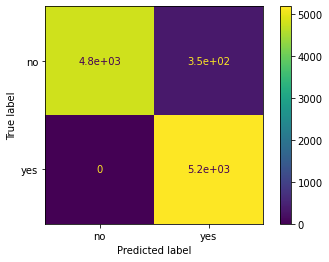

In [ ]:
plot_confusion_matrix(bad_rf_clf, bad_X_test, bad_y_test)

In [ ]:
import altair as alt

alt.data_transformers.disable_max_rows()

GOOD = alt.Chart(good_index).mark_rect().encode(
    alt.X("y", title = "Term Deposit", axis=alt.Axis(labelFontSize=12, labelAngle=0)),
    alt.Y("count()"),
    alt.Color("y", legend = alt.Legend(title = "Yes/No"))
).properties(
    width = 100,
    title = "Number of clients sign term deposit during Good CCI"
)

BAD = alt.Chart(bad_index).mark_rect().encode(
    alt.X("y", title = "Term Deposit", axis=alt.Axis(labelFontSize=12, labelAngle=0)),
    alt.Y("count()"),
    alt.Color("y", legend = alt.Legend(title = "Yes/No"))
).properties(
    width = 100,
    title = "Number of clients sign term deposit during Bad CCI"
)


GOOD | BAD

alt.HConcatChart(...)

In [ ]:
good_index[good_index.y == "yes"].y.count()

1920

In [ ]:
good_index[good_index.y == "yes"].y.count() / good_index[good_index.y == "no"].y.count()

0.14400360009000224

In [ ]:
bad_index[bad_index.y == "yes"].y.count() / bad_index[bad_index.y == "no"].y.count()

0.11319841192989251

Preserve

In [ ]:
import pickle

# save the model to disk
filename = 'bad_index.sav'
pickle.dump(bad_rf_clf, open(filename, 'wb'))

loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(bad_X_test, bad_y_test)
print(result)

0.9664955940737872


In [ ]:
# save the model to disk
filename = 'good_index.sav'
pickle.dump(good_rf_clf, open(filename, 'wb'))

loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(good_X_test, good_y_test)
print(result)

0.9563521823908805
